# OpenAI's o1 Reasoning Model vs. GPT

## Introduction
OpenAI's o1 reasoning model is designed for complex problem-solving, data analysis, and image interpretation by simulating a multi-step thought process before generating responses. Unlike traditional GPT models, which produce output in a single pass, reasoning models use internal **reasoning tokens** to explore multiple approaches before finalizing an answer.
<p align="center">
    <img src="https://cdn.openai.com/API/images/guides/reasoning_tokens.png" alt="Reasoning Tokens" width="600">
</p>  

*Source: [OpenAI Reasoning Models Guide](https://platform.openai.com/docs/guides/reasoning)*

**Key Differences: o1 Reasoning Model vs. GPT**
- Multi-step reasoning: o1 evaluates different solutions before selecting the best response.
- Deeper analytical capabilities: Optimized for complex data interpretation tasks.
- Context-aware image analysis: Provides more structured and insightful image descriptions.
- Reasoning Effort Control: Users can adjust the depth of reasoning (`low`, `medium`, `high`).


For more details, refer to the [OpenAI Reasoning Models Guide](https://platform.openai.com/docs/guides/reasoning).


## Purchase and Store API Key

You need to **purchase** your [OpenAI](https://openai.com/) API key and store it securely, such as in **AWS Secrets Manager**.

- **Key Name:** `api_key`  
- **Key Value:** `<your OpenAI API key>`  
- **Secret Name:** `openai`  

## Install Python Libraries

- **openai**: Used to call `o1` and `GPT` models for data analysis and image interpretation.

In [4]:
pip install openai -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sparkmagic 0.21.0 requires pandas<2.0.0,>=0.17.1, but you have pandas 2.3.3 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


## Import Required Libraries

The following libraries are used in this notebook:

- **boto3**: AWS SDK for Python, used to interact with AWS services.
- **json**: Standard Python library for handling JSON data.
- **IPython.display**: Provides tools to display images, Markdown content, and other rich media in Jupyter Notebook.
- **openai**: Used to call `o1` and `GPT` models for data analysis and image interpretation.
- **pandas**: A powerful library for data manipulation and analysis.
- **pprint**: Pretty prints data structures for better readability.

In [5]:
import boto3
import json
from IPython.display import display, Image, Markdown
from openai import OpenAI
import pandas as pd
from pprint import pprint

## Retrieve API Keys Securely from AWS Secrets Manager

The following function, `get_secret()`, retrieves a secret from **AWS Secrets Manager**. This is a secure way to store and access sensitive credentials, such as API keys, without hardcoding them into the script

In [6]:
def get_secret(secret_name):
    region_name = "us-east-1"

    # Create a Secrets Manager client
    session = boto3.session.Session()
    client = session.client(
        service_name='secretsmanager',
        region_name=region_name
    )

    try:
        get_secret_value_response = client.get_secret_value(
            SecretId=secret_name
        )
    except ClientError as e:
        raise e

    secret = get_secret_value_response['SecretString']
    
    return json.loads(secret)

## Initialize OpenAI Client

The following code initializes the OpenAI client using a securely stored API key retrieved from AWS Secrets Manager.

In [7]:
client = OpenAI(api_key= get_secret('openai')['api_key'])

## Load and Analyze the Diamonds Dataset

This notebook uses the **diamonds dataset ([diamonds.csv](https://github.com/lbsocial/data-analysis-with-generative-ai/blob/main/diamonds.csv))**, which contains detailed attributes of diamonds, including weight, color, clarity, and price.

One interesting pattern in the dataset is that **diamonds with "IF" (Internally Flawless) clarity tend to have the lowest average price** compared to other clarity grades. This observation is counterintuitive, as one might expect the highest-clarity diamonds to be the most expensive.

In [30]:
# Load CSV as plain text
with open('diamonds.csv', 'r', encoding='utf-8') as f:
    data_text = f.read()

print(data_text[:500])  # show first 500 characters

﻿IDNO,WEIGHT,COLOR,CLARITY,RATER,PRICE
1,0.3,D,VS2,GIA,1302
2,0.3,E,VS1,GIA,1510
3,0.3,G,VVS1,GIA,1510
4,0.3,G,VS1,GIA,1260
5,0.31,D,VS1,GIA,1641
6,0.31,E,VS1,GIA,1555
7,0.31,F,VS1,GIA,1427
8,0.31,G,VVS2,GIA,1427
9,0.31,H,VS2,GIA,1126
10,0.31,I,VS1,GIA,1126
11,0.32,F,VS1,GIA,1468
12,0.32,G,VS2,GIA,1202
13,0.33,E,VS2,GIA,1327
14,0.33,I,VS2,GIA,1098
15,0.34,E,VS1,GIA,1693
16,0.34,F,VS1,GIA,1551
17,0.34,G,VS1,GIA,1410
18,0.34,G,VS2,GIA,1269
19,0.34,H,VS1,GIA,1316
20,0.34,H,VS2,GIA,1222
21,0.35,E,VS


## Generate Data Analysis Prompt for OpenAI Model

To investigate why diamonds with **IF (Internally Flawless) clarity** have the **lowest average price**, we generate a structured prompt for the OpenAI model. The model will analyze the dataset and generate insights, including **Python code for visualizations**.


In [31]:
data_prompt = f"""Analyze the provided data and determine 
                Why diamonds with IF clarity have the lowest average price. 
                You may use Python code to support your conclusion. 
                Data: {data_text}"""
# print(prompt)

## Define a Function to Get Assistance from OpenAI GPT-4o

The following function, `openai_gpt_help()`, sends a prompt to OpenAI's **GPT-4o model** and returns a response. It also prints the number of tokens used in the request.

In [8]:
def openai_gpt_help(prompt):
    messages = [{"role": "user", "content": prompt}]
    response = client.chat.completions.create(
        model='gpt-4o',
        messages=messages,
        temperature = 0
    )
    token_usage = response.usage
    
    pprint(f"Tokens used: {token_usage}")

    return response.choices[0].message.content

In [33]:
gpt_result = openai_gpt_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=5162, prompt_tokens=4708, '
 'total_tokens=9870, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [34]:
display(Markdown(gpt_result))

To analyze why diamonds with IF (Internally Flawless) clarity have the lowest average price, we need to first filter the dataset for diamonds with IF clarity and then calculate their average price. We can use Python with libraries like pandas to perform this analysis. Let's write the code to do this:

```python
import pandas as pd
from io import StringIO

# The provided data as a string
data = """
IDNO,WEIGHT,COLOR,CLARITY,RATER,PRICE
1,0.3,D,VS2,GIA,1302
2,0.3,E,VS1,GIA,1510
3,0.3,G,VVS1,GIA,1510
4,0.3,G,VS1,GIA,1260
5,0.31,D,VS1,GIA,1641
6,0.31,E,VS1,GIA,1555
7,0.31,F,VS1,GIA,1427
8,0.31,G,VVS2,GIA,1427
9,0.31,H,VS2,GIA,1126
10,0.31,I,VS1,GIA,1126
11,0.32,F,VS1,GIA,1468
12,0.32,G,VS2,GIA,1202
13,0.33,E,VS2,GIA,1327
14,0.33,I,VS2,GIA,1098
15,0.34,E,VS1,GIA,1693
16,0.34,F,VS1,GIA,1551
17,0.34,G,VS1,GIA,1410
18,0.34,G,VS2,GIA,1269
19,0.34,H,VS1,GIA,1316
20,0.34,H,VS2,GIA,1222
21,0.35,E,VS1,GIA,1738
22,0.35,F,VS1,GIA,1593
23,0.35,G,VS1,GIA,1447
24,0.35,H,VS2,GIA,1255
25,0.36,F,VS1,GIA,1635
26,0.36,H,VVS2,GIA,1485
27,0.37,F,VS2,GIA,1420
28,0.37,H,VS1,GIA,1420
29,0.4,F,VS1,GIA,1911
30,0.4,H,VS1,GIA,1525
31,0.41,F,VS1,GIA,1956
32,0.43,H,VVS2,GIA,1747
33,0.45,I,VS1,GIA,1572
34,0.46,E,VVS2,GIA,2942
35,0.48,G,VVS2,GIA,2532
36,0.5,E,VS1,GIA,3501
37,0.5,E,VS1,GIA,3501
38,0.5,F,VVS2,GIA,3501
39,0.5,F,VS1,GIA,3293
40,0.5,G,VS1,GIA,3016
41,0.51,F,VVS2,GIA,3567
42,0.51,G,VS1,GIA,3205
43,0.52,D,VS2,GIA,3490
44,0.52,E,VS1,GIA,3635
45,0.52,F,VVS2,GIA,3635
46,0.52,F,VS1,GIA,3418
47,0.53,D,VS1,GIA,3921
48,0.53,F,VVS2,GIA,3701
49,0.53,F,VS1,GIA,3480
50,0.53,G,VVS2,GIA,3407
51,0.54,E,VS1,GIA,3767
52,0.54,F,VVS1,GIA,4066
53,0.55,E,VVS2,GIA,4138
54,0.55,F,VS1,GIA,3605
55,0.55,G,VVS2,GIA,3529
56,0.56,F,VS1,GIA,3667
57,0.56,I,VVS2,GIA,2892
58,0.57,G,VVS2,GIA,3651
59,0.59,G,VVS2,GIA,3773
60,0.6,F,VS1,GIA,4291
61,0.62,E,VVS1,GIA,5845
62,0.63,G,VVS2,GIA,4401
63,0.64,G,VVS1,GIA,4759
64,0.66,H,VVS1,GIA,4300
65,0.7,F,VS1,GIA,5510
66,0.7,G,VS1,GIA,5122
67,0.7,H,VVS2,GIA,5122
68,0.7,I,VS2,GIA,3861
69,0.71,F,VVS2,GIA,5881
70,0.71,F,VS1,GIA,5586
71,0.71,F,VS2,GIA,5193
72,0.71,H,VVS2,GIA,5193
73,0.72,F,VS2,GIA,5263
74,0.8,I,VVS2,GIA,5441
75,0.82,I,VS2,GIA,4948
76,0.84,H,VS2,GIA,5705
77,0.85,F,VS2,GIA,6805
78,0.86,H,VVS2,GIA,6882
79,0.89,H,VS1,GIA,6709
80,0.9,I,VVS2,GIA,6682
81,0.5,E,VS1,GIA,3501
82,0.5,G,VVS1,GIA,3432
83,0.51,F,VVS1,GIA,3851
84,0.55,H,IF,GIA,3605
85,0.56,E,VS1,GIA,3900
86,0.57,H,VVS1,GIA,3415
87,0.6,H,IF,GIA,4291
88,0.63,E,IF,GIA,6512
89,0.7,E,VS1,GIA,5800
90,0.7,F,VVS1,GIA,6285
91,0.7,F,VS2,GIA,5122
92,0.7,F,VS2,GIA,5122
93,0.7,G,VS1,GIA,5122
94,0.7,H,VVS2,GIA,5122
95,0.71,D,VS1,GIA,6372
96,0.71,E,VS1,GIA,5881
97,0.71,H,VVS2,GIA,5193
98,0.72,E,VS1,GIA,5961
99,0.72,H,VVS1,GIA,5662
100,0.73,E,VS2,GIA,5738
101,0.73,H,VS1,GIA,5030
102,0.73,H,VS1,GIA,5030
103,0.73,I,VVS1,GIA,4727
104,0.73,I,VS1,GIA,4221
105,0.74,G,VVS2,GIA,5815
106,0.74,H,VS2,GIA,4585
107,0.75,D,VVS2,GIA,7368
108,0.75,I,VVS2,GIA,4667
109,0.75,I,VS1,GIA,4355
110,0.76,D,IF,GIA,9885
111,0.77,F,VVS1,GIA,6919
112,0.78,H,VS1,GIA,5386
113,0.8,I,VS2,GIA,4832
114,0.83,E,VS2,GIA,7156
115,0.9,F,VS1,GIA,7680
116,1,D,VVS1,GIA,15582
117,1,D,VS1,GIA,11419
118,1,E,VS1,GIA,10588
119,1,E,VS2,GIA,9757
120,1,F,IF,GIA,13913
121,1,F,VVS2,GIA,10588
122,1,F,VS1,GIA,10713
123,1,F,VS2,GIA,9480
124,1,G,VVS2,GIA,9896
125,1,G,VS1,GIA,9619
126,1,G,VS2,GIA,9169
127,1,G,VS2,GIA,9203
128,1,H,VS2,GIA,8788
129,1,I,VS1,GIA,8095
130,1,I,VS2,GIA,7818
131,1.01,D,VVS1,GIA,16008
132,1.01,E,VS1,GIA,10692
133,1.01,E,VS2,GIA,9853
134,1.01,F,VS1,GIA,10272
135,1.01,F,VS2,GIA,9573
136,1.01,H,VS1,GIA,9153
137,1.01,H,VS2,GIA,8873
138,1.01,I,VVS1,GIA,8873
139,1.01,I,VVS2,GIA,8455
140,1.01,I,VS2,GIA,7895
141,1.02,F,VS1,GIA,10372
142,1.02,F,VS2,GIA,9666
143,1.02,G,VVS2,GIA,10090
144,1.03,E,VS1,GIA,10900
145,1.04,F,VS1,GIA,10571
146,1.04,I,IF,GIA,9563
147,1.05,I,VVS2,GIA,8781
148,1.06,G,VS2,GIA,9743
149,1.06,H,VS2,GIA,9302
150,1.07,I,VVS2,GIA,8945
151,1.1,H,VS2,GIA,9646
152,0.18,F,VVS1,IGI,823
153,0.18,F,VVS2,IGI,765
154,0.18,G,IF,IGI,803
155,0.18,G,IF,IGI,803
156,0.18,G,VVS2,IGI,705
157,0.18,H,IF,IGI,725
158,0.19,D,VVS2,IGI,967
159,0.19,E,IF,IGI,1050
160,0.19,F,IF,IGI,967
161,0.19,F,VVS1,IGI,863
162,0.19,F,VVS2,IGI,800
163,0.19,G,IF,IGI,842
164,0.19,G,VVS1,IGI,800
165,0.19,H,IF,IGI,758
166,0.2,D,VS1,IGI,880
167,0.2,G,IF,IGI,880
168,0.2,G,VS1,IGI,705
169,0.2,G,VS2,IGI,638
170,0.21,D,VS1,IGI,919
171,0.21,E,IF,IGI,1149
172,0.21,F,IF,IGI,1057
173,0.21,G,IF,IGI,919
174,0.22,E,IF,IGI,1198
175,0.23,E,IF,IGI,1248
176,0.23,F,IF,IGI,1147
177,0.23,G,IF,IGI,995
178,0.24,H,IF,IGI,1108
179,0.25,F,IF,IGI,1485
180,0.25,G,IF,IGI,1283
181,0.25,H,IF,IGI,1149
182,0.25,I,IF,IGI,1082
183,0.26,F,IF,IGI,1539
184,0.26,F,VVS1,IGI,1365
185,0.26,F,VVS2,IGI,1260
186,0.26,I,IF,IGI,1121
187,0.27,F,IF,IGI,1595
188,0.27,H,IF,IGI,1233
189,0.28,I,IF,IGI,1199
190,0.29,G,IF,IGI,1471
191,0.29,I,IF,IGI,1238
192,0.3,E,VVS2,IGI,1580
193,0.3,F,VVS2,IGI,1459
194,0.3,G,VVS1,IGI,1459
195,0.3,H,VVS2,IGI,1218
196,0.3,I,IF,IGI,1299
197,0.31,E,VVS2,IGI,1628
198,0.31,F,VVS1,IGI,1628
199,0.31,I,IF,IGI,1337
200,0.32,H,IF,IGI,1462
201,0.33,H,IF,IGI,1503
202,0.34,F,VVS1,IGI,1773
203,0.34,F,VVS2,IGI,1636
204,0.35,F,VVS1,IGI,1821
205,0.35,G,VVS2,IGI,1540
206,0.4,G,IF,IGI,2276
207,0.41,I,VVS1,IGI,1616
208,0.41,I,VVS2,IGI,1506
209,0.47,F,VVS2,IGI,2651
210,0.48,F,VS1,IGI,2383
211,0.5,G,IF,IGI,3652
212,0.51,E,VVS2,IGI,3722
213,0.51,F,VVS1,IGI,3722
214,0.52,I,IF,IGI,3095
215,0.55,F,VVS2,IGI,3706
216,0.56,E,VVS2,IGI,4070
217,0.56,G,VVS2,IGI,3470
218,0.58,E,VVS1,IGI,4831
219,0.58,F,VVS1,IGI,4209
220,0.58,G,VVS1,IGI,3821
221,0.7,G,VVS1,IGI,5607
222,0.7,G,VVS2,IGI,5326
223,0.71,D,VS1,IGI,6160
224,0.76,F,VVS2,IGI,6095
225,0.78,G,VVS2,IGI,5937
226,1,H,VVS2,IGI,9342
227,1.01,G,VS1,IGI,9713
228,1.01,H,VS2,IGI,8873
229,1.01,I,VS1,IGI,8175
230,0.5,F,VVS1,HRD,3778
231,0.5,G,VVS1,HRD,3432
232,0.51,F,VVS1,HRD,3851
233,0.52,E,VS2,HRD,3346
234,0.52,H,VVS1,HRD,3130
235,0.53,F,VVS1,HRD,3995
236,0.53,F,VVS2,HRD,3701
237,0.55,G,VVS2,HRD,3529
238,0.56,F,VS1,HRD,3667
239,0.56,F,VS2,HRD,3202
240,0.57,F,VS2,HRD,3256
241,0.57,H,VVS1,HRD,3415
242,0.58,H,IF,HRD,3792
243,0.6,G,VS1,HRD,3925
244,0.6,G,VS2,HRD,3421
245,0.6,H,VVS1,HRD,3925
246,0.61,H,VVS2,HRD,3616
247,0.62,I,VVS2,HRD,3615
248,0.64,H,VVS2,HRD,3785
249,0.65,I,VVS2,HRD,3643
250,0.66,H,VVS1,HRD,4300
251,0.7,E,VVS1,HRD,6867
252,0.7,E,VVS2,HRD,6285
253,0.7,G,VVS1,HRD,5800
254,0.7,G,VVS2,HRD,5510
255,0.7,H,VS2,HRD,4346
256,0.71,G,IF,HRD,6372
257,0.71,H,VVS2,HRD,5193
258,0.72,H,VVS1,HRD,5662
259,0.73,F,VS2,HRD,5333
260,0.73,G,VVS1,HRD,6041
261,0.74,H,VVS1,HRD,5815
262,0.8,F,IF,HRD,8611
263,0.8,F,VS1,HRD,6905
264,0.8,G,VVS2,HRD,6905
265,0.8,H,VVS2,HRD,6416
266,0.8,H,VS1,HRD,6051
267,0.81,E,VVS1,HRD,8715
268,0.81,E,VS2,HRD,6988
269,0.81,F,VS1,HRD,6988
270,0.81,G,VS1,HRD,6495
271,0.81,H,IF,HRD,7358
272,0.82,F,VS2,HRD,6572
273,0.82,G,VVS2,HRD,7072
274,0.85,F,VVS1,HRD,8359
275,0.85,F,VS2,HRD,6805
276,0.85,G,VVS1,HRD,7711
277,0.86,H,VS2,HRD,5835
278,1,D,VVS2,HRD,13775
279,1,E,VVS1,HRD,14051
280,1,E,VVS2,HRD,11419
281,1,E,VS1,HRD,10588
282,1,F,VVS1,HRD,11696
283,1,F,VVS2,HRD,10588
284,1,G,VVS1,HRD,10450
285,1,G,VVS2,HRD,9896
286,1,G,VS2,HRD,9203
287,1,H,VVS1,HRD,9480
288,1,H,VS1,HRD,9065
289,1,H,VS2,HRD,8788
290,1,I,VVS1,HRD,8788
291,1,I,VVS2,HRD,8372
292,1,I,VS1,HRD,8095
293,1,I,VS2,HRD,7818
294,1.01,D,VVS2,HRD,13909
295,1.01,E,VVS2,HRD,11531
296,1.01,E,VS1,HRD,10692
297,1.01,F,VVS1,HRD,11811
298,1.01,F,VS1,HRD,10272
299,1.01,G,VVS2,HRD,9993
300,1.01,G,VS2,HRD,9293
301,1.01,H,VVS2,HRD,9433
302,1.01,H,VS1,HRD,9153
303,1.01,I,VVS1,HRD,8873
304,1.01,I,VS1,HRD,8175
305,1.02,F,VVS2,HRD,10796
306,1.06,H,VVS2,HRD,9890
307,1.02,H,VS2,HRD,8959
308,1.09,I,VVS2,HRD,9107
"""

# Read the data into a pandas DataFrame
df = pd.read_csv(StringIO(data))

# Filter the data for diamonds with IF clarity
if_clarity_df = df[df['CLARITY'] == 'IF']

# Calculate the average price of diamonds with IF clarity
average_price_if_clarity = if_clarity_df['PRICE'].mean()

# Print the average price
print(f"Average price of diamonds with IF clarity: {average_price_if_clarity}")

# Check the number of diamonds with IF clarity
num_if_clarity = if_clarity_df.shape[0]
print(f"Number of diamonds with IF clarity: {num_if_clarity}")

# Check the distribution of weights for IF clarity diamonds
weight_distribution_if_clarity = if_clarity_df['WEIGHT'].value_counts()
print("Weight distribution for IF clarity diamonds:")
print(weight_distribution_if_clarity)
```

### Analysis:

1. **Average Price Calculation**: The code calculates the average price of diamonds with IF clarity. This will help us understand if the average price is indeed low compared to other clarity grades.

2. **Number of Diamonds**: The code checks how many diamonds in the dataset have IF clarity. A small sample size could lead to skewed average prices.

3. **Weight Distribution**: The code also checks the distribution of weights for diamonds with IF clarity. If the IF diamonds are generally smaller, this could explain a lower average price, as weight significantly impacts diamond pricing.

### Conclusion:

- If the average price of IF clarity diamonds is low, it could be due to a small sample size or a concentration of smaller diamonds in this category.
- The weight distribution will provide insights into whether the IF diamonds are generally smaller, which would contribute to a lower average price.
- Additionally, the presence of diamonds with lower color grades or from less prestigious raters could also affect the average price.

By running the code, you can verify these hypotheses and gain a clearer understanding of why IF clarity diamonds might have a lower average price in this dataset.

## Define a Function to Get Assistance from OpenAI o1 Model  

The following function, `openai_o_help()`, sends a prompt to OpenAI's **o1 reasoning model** and returns a response.  

### Key Differences Between o1 and GPT Models:
- **Reasoning Effort**: The o1 model allows users to control reasoning depth using `reasoning_effort` (`low`, `medium`, `high`).  
- **No Temperature Parameter**: Unlike GPT models, **o1 does not support `temperature`**.  
- **Developer Messages Replace System Messages**:  
  - Starting with `o1-2024-12-17`, **developer messages** replace **system messages** to align with chain-of-command behavior.  

### Best Practices for Prompting o1  
- **Keep prompts simple and direct.**  
- **Avoid chain-of-thought prompts.** o1 reasons internally, so step-by-step instructions aren't needed.  
- **Use delimiters for clarity.** Use Markdown, XML tags, or section titles.  
- **Try zero-shot first.** If needed, add few-shot examples that closely match your goal.  
- **Be explicit.** Clearly define success criteria and constraints.  
- **Markdown is disabled by default.** To enable, start with `"Formatting re-enabled"`.  

Source: [OpenAI Reasoning Models Best Practices Guide](https://platform.openai.com/docs/guides/reasoning-best-practices).  


In [9]:
def openai_o_help(prompt):
    messages = [ {"role": "user", "content": prompt}]
    response = client.chat.completions.create(
        model='o1',
        reasoning_effort="high", # low, medium or high
        messages=messages,

    )
    token_usage = response.usage
    
    pprint(f"Tokens used: {token_usage}")

    return response.choices[0].message.content

In [36]:
o1_result = openai_o_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=3340, prompt_tokens=4707, '
 'total_tokens=8047, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=2688, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, '
 'cached_tokens=3968))')


In [37]:
print(o1_result)

Below is a concise explanation, backed by a simple Python grouping analysis, showing that the “IF” (Internally Flawless) stones in this dataset skew toward smaller (and sometimes lower‐color) diamonds, thus pulling down their overall average price despite IF being the highest clarity grade.

--------------------------------------------------------------------------------
1. Core Reason
--------------------------------------------------------------------------------
• Carat weight is by far the biggest driver of total diamond price.  
• In these records, many IF‐clarity diamonds are quite small (e.g., 0.18–0.3 ct).  
• Even though IF clarity commands a premium per carat, small stones in the IF group lower the average total price relative to larger stones in other clarity grades.

--------------------------------------------------------------------------------
2. Illustrated With Python
--------------------------------------------------------------------------------
Below is a short snip

## Load and Display an Image from a URL

This code retrieves an image from a specified URL and displays it using the **PIL (Pillow) library**.

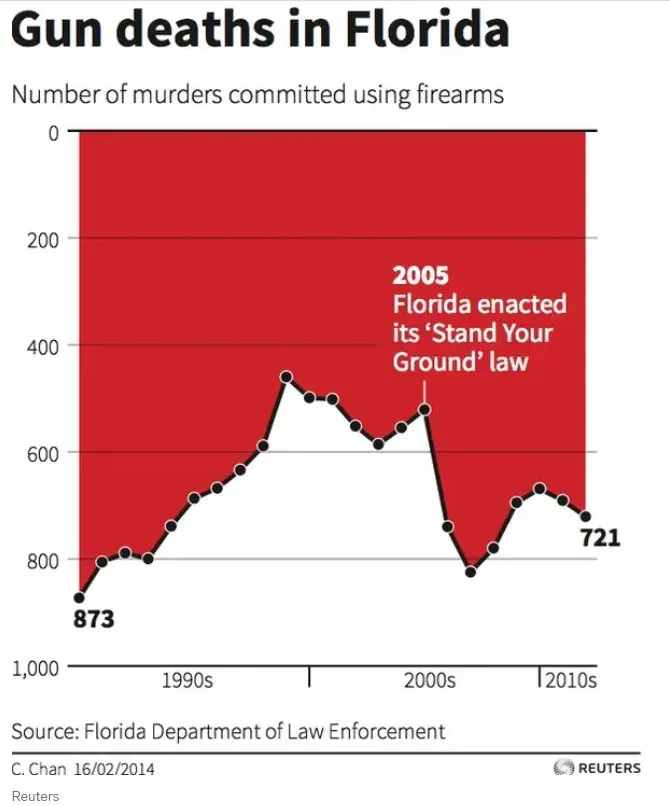

In [38]:
from PIL import Image
import requests
from io import BytesIO

image_url = "https://miro.medium.com/v2/resize:fit:4800/format:webp/1*VPRpf0YnchAwN0mjeAz4pA.jpeg"
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))
img.show()

## Create an Image Analysis Prompt

The following code constructs a **structured prompt** for analyzing an image. It sends both **text input** and an **image URL** to an AI model for interpretation.


In [39]:
image_prompt = [
                    {"type": "text", "text": 'what is wrong with this image?'},
                    {"type": "image_url", "image_url": {
                        "url": image_url}
                    }
                ]

In [40]:
gpt_result = openai_gpt_help(prompt=image_prompt)

('Tokens used: CompletionUsage(completion_tokens=47, prompt_tokens=779, '
 'total_tokens=826, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [41]:
display(Markdown(gpt_result))

The image has a misleading y-axis. The axis starts at 600 instead of 0, which exaggerates the visual difference in the number of gun deaths over time. This can make the changes appear more dramatic than they actually are.

In [42]:
o1_result = openai_o_help(prompt=image_prompt)

('Tokens used: CompletionUsage(completion_tokens=2618, prompt_tokens=688, '
 'total_tokens=3306, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=2496, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [43]:
display(Markdown(o1_result))

A quick glance at the y‐axis reveals that it runs “backwards”—it puts zero at the top and 1000 at the bottom. As a result, larger values (like the 873 figure) are plotted lower than smaller ones (such as 721), making the chart appear upside down and confusing the trend it’s supposed to show.

## 🧠 Try It Yourself: Reasoning Model Practice

Now that you’ve explored how **GPT-4o** and **OpenAI’s o1 reasoning model** handle data and images,  
try applying these models to real-world intelligence analysis scenarios.

👉 Be sure to **run every cell** you add and keep all outputs visible before submitting your notebook to GitHub.

### 1. Upload and Reason on a Text File
- Upload a short **text document** (for example, a news article, policy brief, or intelligence report).  
- Use both **GPT-4o** and **o1** to analyze the file.  
  Try questions like:
  - *“Summarize the key actors, motivations, and outcomes in this text.”*  
  - *“What potential implications could these events have on regional stability?”*  
  - *“Identify possible biases or information gaps.”*  
- Compare how each model approaches reasoning, depth, and evidence.

*(Hint: You can upload a text file in JupyterLab using the left file browser → right-click → “Upload File.” Then open and read it with Python using `open('filename.txt').read()`.)*


In [44]:
# Load CSV as plain text
with open('news.txt', 'r', encoding='utf-8') as f:
    data_text = f.read()

print(data_text[:500])  # show first 500 characters

GYEONGJU, South Korea — President Trump sat down with President Xi Jinping of China on the sidelines of the Asia-Pacific Economic Cooperation convention (APEC) in South Korea last week.

The leaders of the world's biggest economies met at the airport in Busan, an hour's drive away from the APEC host city of Gyeongju, for just an hour and 40 minutes.

President Donald Trump, left, and Chinese President Xi Jinping, right, shake hands after their U.S.-China summit meeting at Gimhae International Ai


In [46]:
data_prompt = f"""Based on the following article, what are the potential policy implications for South Korea's foreign relations strategy? 
Consider economic, security, and diplomatic dimensions. 
Text: {data_text}"""

In [47]:
gpt_result = openai_gpt_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=553, prompt_tokens=1304, '
 'total_tokens=1857, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [48]:
display(Markdown(gpt_result))

The article highlights several key issues that could influence South Korea's foreign relations strategy, particularly in the economic, security, and diplomatic dimensions. Here are the potential policy implications for South Korea:

### Economic Implications:
1. **Diversification of Trade Partners**: With the U.S. potentially surpassing China as South Korea's largest trading partner, South Korea may seek to further diversify its trade relationships to reduce dependency on any single country. This could involve strengthening ties with other APEC members and exploring new markets.

2. **Investment in the U.S.**: The tariff deal with the U.S. suggests a strategic economic alignment with Washington. South Korea's commitment to invest $350 billion in the U.S. over the next decade indicates a long-term economic partnership that could lead to increased economic interdependence.

3. **Technological Competition with China**: As China becomes a global rival in key industries, South Korea might need to invest more in innovation and technology to maintain its competitive edge. This could involve increased R&D spending and fostering domestic industries like EVs and electronics.

### Security Implications:
1. **Strengthening U.S. Alliance**: The approval of South Korea's push for a nuclear-powered submarine by the U.S. underscores the importance of the U.S.-South Korea security alliance. South Korea may continue to deepen military cooperation with the U.S. to counterbalance regional threats, particularly from North Korea and a rising China.

2. **Navigating THAAD-Related Tensions**: The unresolved issues surrounding the THAAD missile defense system highlight ongoing security tensions with China. South Korea may need to engage in diplomatic efforts to mitigate these tensions while maintaining its defense posture.

### Diplomatic Implications:
1. **Balancing Act Between U.S. and China**: South Korea's foreign policy will likely continue to involve a delicate balancing act between the U.S. and China. While aligning more closely with the U.S. economically and militarily, South Korea will need to manage its diplomatic relations with China to avoid further economic retaliation.

2. **Role in Multilateral Forums**: As the chair of APEC, South Korea has an opportunity to play a leading role in promoting multilateral cooperation despite differing values among member countries. This could enhance South Korea's diplomatic influence in the region and globally.

3. **Addressing Anti-China Sentiment**: The growing anti-China sentiment among South Koreans, particularly the younger generation, could influence domestic politics and foreign policy. The government may need to address these sentiments to maintain social cohesion and ensure stable diplomatic relations with China.

Overall, South Korea's foreign relations strategy will likely involve a nuanced approach that balances economic interests, security needs, and diplomatic relations in a complex and evolving geopolitical landscape.

In [49]:
o1_result = openai_o_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=2076, prompt_tokens=1303, '
 'total_tokens=3379, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=1152, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [50]:
print(o1_result)

Below is a three-part analysis of potential policy implications for South Korea’s foreign relations strategy—covering economic, security, and diplomatic dimensions—based on the article’s description of shifting global dynamics and Korea’s position between the U.S. and China.

1) Economic Dimensions  
• Deepened U.S.-Korea Economic Ties:  
  – The newly finalized tariff deal (lower tariffs in exchange for large-scale Korean investments in the U.S.) indicates that Seoul is moving closer to Washington economically.  
  – As the U.S. closes the gap with China in importing South Korean goods, Korea may view the U.S. market as an increasingly critical export destination, prompting further alignment with U.S. trade policies.  
• Risk Management and Supply Chain Diversification:  
  – China’s past use of economic reprisals (e.g., targeting tourism and entertainment industries over THAAD) highlights Korea’s vulnerability to unilateral Chinese action. This may push Seoul to diversify supply chai

### 2. Try Another Image
- Replace the existing image URL with a **different image**, such as a map, protest photo, or satellite image.  
- Ask both models:
  - *“What do you observe in this image?”*  
  - *“What might this image imply in a geopolitical or social context?”*  
- Note differences in how **GPT-4o** and **o1** reason about visual clues.

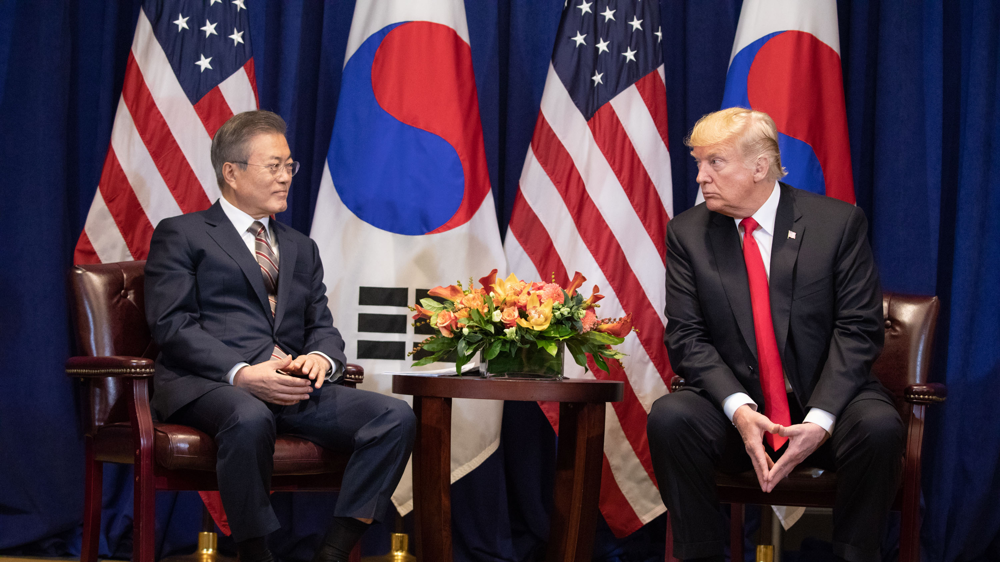

In [ ]:
from PIL import Image
import requests
from io import BytesIO

image_url = "https://csis-website-prod.s3.amazonaws.com/s3fs-public/publication/191125_korea.jpg"
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))
img.show()

In [55]:
image_prompt = [
                    {"type": "text", "text": 'What might this image imply in a geopolitical or social context?'},
                    {"type": "image_url", "image_url": {
                        "url": image_url}
                    }
                ]

gpt_result = openai_gpt_help(prompt=image_prompt)

('Tokens used: CompletionUsage(completion_tokens=93, prompt_tokens=1124, '
 'total_tokens=1217, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [56]:
display(Markdown(gpt_result))

The image shows two individuals sitting in front of the flags of South Korea and the United States, suggesting a diplomatic meeting between representatives of these countries. This setting implies discussions on geopolitical issues, such as security, trade, or regional stability, particularly concerning the Korean Peninsula. The presence of both flags highlights the importance of the bilateral relationship and potential collaboration or negotiation on international matters. The formal setting and body language can also indicate the seriousness and significance of the topics being discussed.

In [57]:
o1_result = openai_o_help(prompt=image_prompt)

('Tokens used: CompletionUsage(completion_tokens=1312, prompt_tokens=993, '
 'total_tokens=2305, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=1152, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [58]:
print(o1_result)

It appears to show two high-level officials—one from the United States and one from the Republic of Korea—meeting in a formal setting, with each nation’s flag prominently displayed. In a geopolitical context, such imagery typically underscores the significance of the alliance or relationship between these two countries, which often involves cooperation on security matters, trade, and broader regional stability. The posture and facial expressions of the officials can also convey a sense of how discussions are proceeding—whether they appear tense, cooperative, or merely formal. In a social context, it highlights the importance of symbolism in diplomacy: flags, seating arrangements, and body language all help signal the state of bilateral relations and the level of mutual respect or caution each side may be showing.


### 3. Compare Reasoning Quality
- Pose a challenging **analytical or logical question** to both models, such as:
  - *“Which country is likely to gain the most influence from this event and why?”*  
  - *“Given these statements, which scenario is more probable?”*  
- Before asking, provide the model with **sufficient context**, for example:
  - A short paragraph summarizing the situation or event.  
  - Key actors, timeline, and relevant evidence (from your uploaded text file or your own notes).  
- Observe how the **o1 model’s step-by-step reasoning** differs from GPT-4o’s concise response.  
  Consider whether detailed reasoning produces **stronger analytic insights** or introduces **new assumptions**.

In [10]:
data_prompt = f"""In intelligence terms, a regional forecast is an analytical projection of future developments—political, economic, security, or social—within a specific geographic area, used to inform decision-making and strategic planning.Do a regional forecast of Columbia"""

In [11]:
gpt_result = openai_gpt_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=721, prompt_tokens=52, '
 'total_tokens=773, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [12]:
display(Markdown(gpt_result))

Creating a regional forecast for Colombia involves analyzing current trends and projecting potential future developments across various sectors such as politics, economics, security, and social issues. Here’s a general overview based on recent trends and data up to October 2023:

### Political Outlook
1. **Government Stability**: Colombia's political landscape is likely to remain relatively stable, though challenges persist. The administration will continue to face pressure to address corruption, improve governance, and implement reforms promised during elections.
   
2. **Peace Process**: The peace process with the Revolutionary Armed Forces of Colombia (FARC) and other armed groups remains a critical issue. While progress has been made, full implementation of the peace accords is slow, and there may be sporadic setbacks due to political opposition and logistical challenges.

3. **Elections and Political Dynamics**: Upcoming elections could shift the political balance, with potential gains for opposition parties if the current government fails to address key public concerns. Political polarization may increase, impacting legislative efficiency.

### Economic Outlook
1. **Growth Prospects**: Colombia's economy is expected to grow moderately, driven by sectors like mining, agriculture, and services. However, global economic uncertainties, such as fluctuating commodity prices and trade dynamics, could impact growth.

2. **Inflation and Monetary Policy**: Inflationary pressures may persist, influenced by global supply chain issues and domestic factors. The central bank is likely to adjust interest rates to manage inflation while supporting economic growth.

3. **Investment and Trade**: Efforts to attract foreign investment will continue, with a focus on infrastructure and technology. Trade relations, particularly with the United States and regional partners, will be crucial for economic stability.

### Security Outlook
1. **Internal Security**: Despite the peace process, security challenges from remaining armed groups and criminal organizations persist. The government will need to enhance security measures and strengthen law enforcement to address these threats.

2. **Drug Trafficking**: Colombia remains a major producer of cocaine, and efforts to combat drug trafficking will continue to be a priority. International cooperation, particularly with the United States, will be essential in these efforts.

3. **Border Security**: The situation at the Venezuelan border remains tense, with potential for increased migration and cross-border crime. Bilateral relations and regional cooperation will be important in managing these issues.

### Social Outlook
1. **Social Inequality**: Addressing social inequality and poverty will be a significant challenge. Government initiatives aimed at improving education, healthcare, and social services are crucial for long-term stability.

2. **Public Protests and Social Movements**: Social unrest and protests may occur, driven by dissatisfaction with economic conditions, inequality, and government policies. The government’s response to these movements will be critical in maintaining social cohesion.

3. **Migration**: The influx of Venezuelan migrants will continue to impact Colombia’s social services and labor market. Effective integration policies will be necessary to manage this demographic change.

### Environmental Outlook
1. **Climate Change and Environmental Policies**: Colombia is vulnerable to climate change impacts, such as extreme weather events and biodiversity loss. The government is likely to enhance environmental policies and international cooperation to address these challenges.

2. **Sustainable Development**: Efforts to balance economic growth with environmental sustainability will be important, particularly in sectors like agriculture and mining.

In summary, Colombia faces a complex array of challenges and opportunities. The government's ability to implement effective policies across these areas will be crucial in shaping the country's future trajectory. Continued international cooperation and domestic reforms will be key to addressing these multifaceted issues.

In [13]:
o1_result = openai_o_help(prompt=data_prompt)

('Tokens used: CompletionUsage(completion_tokens=2114, prompt_tokens=51, '
 'total_tokens=2165, '
 'completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, '
 'audio_tokens=0, reasoning_tokens=896, rejected_prediction_tokens=0), '
 'prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))')


In [14]:
print(o1_result)

Below is a strategic-level forecast for Colombia (commonly misspelled as “Columbia”) covering political, economic, security, and social dimensions. This outlook focuses on the short- to medium-term future (the next 1–3 years) and identifies key trends that may shape the country’s stability and development.

1) Political Outlook  
• Governance and Reform Agenda: President Gustavo Petro’s administration is the first left-leaning government in Colombia’s modern history. Petro’s policy priorities include social and economic reforms, environmental protection, and advancing peace talks with armed groups. Although there is support for implementing structural changes, pushback from conservative parties and business interests could slow or dilute the reform process.  
• Peace Negotiations: Renewed negotiations with the National Liberation Army (ELN) and efforts to implement the 2016 peace agreement with the FARC will remain a core political focus. Progress toward lasting peace is likely to be u

## References  
- **OpenAI Reasoning Models Guide**: [OpenAI](https://platform.openai.com/docs/guides/reasoning)  
- **OpenAI Reasoning Models Best Practices Guide**: [OpenAI](https://platform.openai.com/docs/guides/reasoning-best-practices)  
- **Colin Jarvis. “Reasoning with O1.” DeepLearning.AI.** Accessed February 14, 2025. [DeepLearning.AI](https://www.deeplearning.ai/short-courses/reasoning-with-o1/)  